In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn

# The Data

- 1,000,209 anonymous ratings 
- ~3,900 movies 
- ratings by 6,040 MovieLens users
- users joined MovieLens in 2000
- all data is provided by useres voluntarily

## Define the Problem

### Notation (needs edit / credit)

- $U$ is the set of users in our domain. Its size is $|U|$.
- $I$ is the set of items in our domain. Its size is $|I|$.
- $I(u)$ is the set of items that user $u$ has rated.
- $-I(u)$ is the complement of $I(u)$ i.e., the set of items not yet seen by user $u$.
- $U(i)$ is the set of users that have rated item $i$.
- $-U(i)$ is the complement of $U(i)$.
- $S(u,i)$ is a function that measures the utility of item $i$ for user $u$.

### Solve for
$
i^{*} = argmax_{i \in -I(u)} S(u,i), \forall{u \in U}
$

### In English

out of movies that a user hasn't seen, which ones will that user be likely to enjoy? Recommend these movies

## Identify your client

Netflix, IMDB, Social Medida, etc. Anywhere with movie recommendations.

## Describe your data set, and how you cleaned/wrangled it

Data is formatted a little funnily, working with dat files where data is seperated by "::" markers. Start by reading and joining the three data sets - the list of movies, the list of ratings, and the the list of users. 

In [2]:
movies = pd.read_table('movies.dat', sep="::", header=None, names=['movie_id', 'movie_title', 'genre'], engine='python')

In [3]:
ratings = pd.read_table('ratings.dat', sep="::", header=None, names=['user_id','movie_id','rating','timestamp'], engine='python')

In [4]:
users = pd.read_table('users.dat', sep='::', names =['user_id', 'gender', 'age', 'occupation', 'zip_code'] , engine='python')

In [5]:
# create one merged DataFrame
movie_ratings = pd.merge(movies, ratings, on="movie_id")
full_set = pd.merge(movie_ratings, users, on="user_id")

In [6]:
full_set.isnull().sum()
len(full_set)

1000209

Great! Now that we have a full data set to work with and no other NA values, let's wrangle the data so that all the columns are as meaningful as possible.

In [7]:
full_set.head()

,movie_id,movie_title,genre,user_id,rating,timestamp,gender,age,occupation,zip_code
0,1,Toy Story (1995),Animation|Children's|Comedy,1,5,978824268,F,1,10,48067
1,48,Pocahontas (1995),Animation|Children's|Musical|Romance,1,5,978824351,F,1,10,48067
2,150,Apollo 13 (1995),Drama,1,5,978301777,F,1,10,48067
3,260,Star Wars: Episode IV - A New Hope (1977),Action|Adventure|Fantasy|Sci-Fi,1,4,978300760,F,1,10,48067
4,527,Schindler's List (1993),Drama|War,1,5,978824195,F,1,10,48067


In [58]:
pd.groupby(full_set, by='gender').size()

gender
F    246440
M    753769
dtype: int64

In [56]:
pd.groupby(full_set, by='rating').size()

rating
1     56174
2    107557
3    261197
4    348971
5    226310
dtype: int64

### To do
- convert genre into multiple columns
- add geographical data? (Zip Code -> City and / or State data.)
- use IMDB Data (Pull more info for each movie somehow)

## Data Visualization with Bokeh

In [8]:
full_set.columns

Index(['movie_id', 'movie_title', 'genre', 'user_id', 'rating', 'timestamp',
       'gender', 'age', 'occupation', 'zip_code'],
      dtype='object')

In [9]:
from bokeh.io import output_notebook, show
output_notebook()

Loading BokehJS ...

In [10]:
from bokeh.charts import Scatter

/Users/Akaash/anaconda3/lib/python3.5/site-packages/bokeh/util/deprecation.py:34: BokehDeprecationWarning: 
The bokeh.charts API has moved to a separate 'bkcharts' package.

This compatibility shim will remain until Bokeh 1.0 is released.
After that, if you want to use this API you will have to install
the bkcharts package explicitly.

  warn(message)


In [11]:
full_set.groupby('gender').size()

gender
F    246440
M    753769
dtype: int64

In [12]:
p = Scatter(full_set, x='timestamp', y='rating')
show(p)

In [13]:
from bokeh.charts import Bar

# Naive Recommender

In [14]:
# Get number of ratings by movie and convert to Pandas DataFrame
num_ratings_by_movie = full_set.groupby('movie_title').size()
num_ratings_by_movie = pd.DataFrame({'movie_title':num_ratings_by_movie.index, 'total ratings': num_ratings_by_movie.values})
# Get mean rating by movie
mean_rating_by_movie = (full_set.groupby('movie_title'))['movie_title','rating'].mean()
mean_rating_by_movie['movie_title'] = mean_rating_by_movie.index

In [15]:
most_popular_movies = pd.merge(mean_rating_by_movie, num_ratings_by_movie).sort_values(by = 'total ratings', ascending= False)

In [59]:
most_popular_movies.head()

,rating,movie_title,total ratings
127,4.317386,American Beauty (1999),3428
3153,4.453694,Star Wars: Episode IV - A New Hope (1977),2991
3154,4.292977,Star Wars: Episode V - The Empire Strikes Back...,2990
3155,4.022893,Star Wars: Episode VI - Return of the Jedi (1983),2883
1789,3.763847,Jurassic Park (1993),2672


In [16]:
# Sort most popular movies by rating 
movies_to_recommend_naive = most_popular_movies[:100].sort_values(by = 'rating', ascending = False)
movies_to_recommend_naive.head()

,rating,movie_title,total ratings
2970,4.554558,"Shawshank Redemption, The (1994)",2227
1354,4.524966,"Godfather, The (1972)",2223
3504,4.517106,"Usual Suspects, The (1995)",1783
2901,4.510417,Schindler's List (1993),2304
2711,4.477725,Raiders of the Lost Ark (1981),2514


By our naive approach, we would recommend the Shawshank Redemption, The Godfather, the Usual Suspects, Schindler's List, and Raiders of the Lost Ark. If the user has seen these movies, we would systematically move down the list until we hit a movie the user hasn't seen yet. 

# Better Recommenders

### Pre-processing (Edit, saved for reference)

This subsection will generate training and testing sets for evaluation. You do
not need to understand every single line of code, just the general gist:

- take a smaller sample from the full 1M dataset for speed reasons;
- make sure that we have at least 2 ratings per user in that subset;
- split the result into training and testing sets.

In [17]:
# Subset data, take 10,000 values
model_data = full_set.ix[np.random.choice(full_set.index, size=10000, replace=False)]

In [18]:
# Subset sampled data set to make sure there are at least 2 ratings per user
user_ids_larger_1 = pd.value_counts(model_data.user_id, sort=False) > 1
user_ids_larger_1 = user_ids_larger_1[user_ids_larger_1].index
model_data = model_data.select(lambda l: model_data.loc[l, 'user_id'] in user_ids_larger_1)
print(model_data.shape)
assert np.all(model_data.user_id.value_counts() > 1)

(8452, 10)


We now generate train and test subsets by marking 20% of each users's ratings, using groupby and apply.

In [19]:
# Split the data into train / test sets (80% and 20% respectively)
def assign_to_set(df):
    sampled_ids = np.random.choice(df.index,
                                   size=np.int64(np.ceil(df.index.size * 0.2)),
                                   replace=False)
    df.ix[sampled_ids, 'for_testing'] = True
    return df

model_data['for_testing'] = False
grouped = model_data.groupby('user_id', group_keys=False).apply(assign_to_set)
model_data_train = model_data[grouped.for_testing == False]
model_data_test = model_data[grouped.for_testing == True]
print(model_data.shape)
print(model_data_train.shape)
print(model_data_test.shape)
assert len(model_data_train.index & model_data_test.index) == 0

(8452, 11)
(5807, 11)
(2645, 11)


### Evaluation: performance criterion

Performance evaluation of recommendation systems is an entire topic all in
itself. Some of the options include:

- RMSE: $\sqrt{\frac{\sum(\hat y - y)^2}{n}}$
- Precision / Recall / F-scores
- ROC curves
- Cost curves

In [20]:
def compute_rmse(y_pred, y_true):
    """ Compute Root Mean Squared Error. """
    
    return np.sqrt(np.mean(np.power(y_pred - y_true, 2)))

### Evaluation: the 'evaluate' method

In [21]:
def evaluate(estimate_f):
    """ RMSE-based predictive performance evaluation with pandas. """
    
    ids_to_estimate = zip(model_data_test.user_id, model_data_test.movie_id)
    estimated = np.array([estimate_f(u,i) for (u,i) in ids_to_estimate])
    real = model_data_test.rating.values
    return compute_rmse(estimated, real)


In [22]:
def my_estimate_function(user_id, movie_id):
    return 3

In [23]:
print('RMSE for my estimate function: %s' % evaluate(my_estimate_function))

RMSE for my estimate function: 1.25651421692


## Some theory for reference - delete later

### Content-based filtering

*Recommend based on the user's rating history.* 

Generic expression (notice how this is kind of a 'row-based' approach):

$$ 
\newcommand{\aggr}{\mathop{\rm aggr}\nolimits}
r_{u,i} = \aggr_{i' \in I(u)} [r_{u,i'}]
$$


A simple example using the mean as an aggregation function:

$$ 
r_{u,i} = \bar r_u = \frac{\sum_{i' \in I(u)} r_{u,i'}}{|I(u)|} 
$$


### Collaborative filtering

*Recommend based on other user's rating histories.* 

Generic expression (notice how this is kind of a 'col-based' approach):

$$ 
\newcommand{\aggr}{\mathop{\rm aggr}\nolimits}
r_{u,i} = \aggr_{u' \in U(i)} [r_{u',i}] 
$$


A simple example using the mean as an aggregation function:

$$ 
r_{u,i} = \bar r_i = \frac{\sum_{u' \in U(i)} r_{u',i}}{|U(i)|} 
$$


### Hybrid solutions

The literature has lots of examples of systems that try to combine the strengths
of the two main approaches. This can be done in a number of ways:

- Combine the predictions of a content-based system and a collaborative system.
- Incorporate content-based techniques into a collaborative approach.
- Incorporarte collaborative techniques into a content-based approach.
- Unifying model.

### Challenges

#### Availability of item metadata

Content-based techniques are limited by the amount of metadata that is available
to describe an item. There are domains in which feature extraction methods are
expensive or time consuming, e.g., processing multimedia data such as graphics,
audio/video streams. In the context of grocery items for example, it's often the
case that item information is only partial or completely missing. Examples
include:

- Ingredients
- Nutrition facts
- Brand
- Description
- County of origin

#### New user problem

A user has to have rated a sufficient number of items before a recommender
system can have a good idea of what their preferences are. In a content-based
system, the aggregation function needs ratings to aggregate.

#### New item problem

Collaborative filters rely on an item being rated by many users to compute
aggregates of those ratings. Think of this as the exact counterpart of the new
user problem for content-based systems.

#### Data sparsity

When looking at the more general versions of content-based and collaborative
systems, the success of the recommender system depends on the availability of a
critical mass of user/item iteractions. We get a first glance at the data
sparsity problem by quantifying the ratio of existing ratings vs $|U|x|I|$. A
highly sparse matrix of interactions makes it difficult to compute similarities
between users and items. As an example, for a user whose tastes are unusual
compared to the rest of the population, there will not be any other users who
are particularly similar, leading to poor recommendations.


### Content-based filtering using mean ratings

With this table-like representation of the ratings data, a basic content-based
filter becomes a one-liner function.

In [24]:
# Returns mean of user_id's ratings 
def content_mean(user_id, movie_id):
    """ Simple content-filtering based on mean ratings. """
    
    user_condition = model_data_train.user_id == user_id
    return model_data_train.loc[user_condition, 'rating'].mean()

print('RMSE for estimate1: %s' % evaluate(content_mean))

RMSE for estimate1: 1.2848753812


### Generalizations of the aggregation function for content-based filtering: incorporating similarities

Possibly incorporating metadata about items, which makes the term 'content' make more sense now.

$$ r_{u,i} = k \sum_{i' \in I(u)} sim(i, i') \; r_{u,i'} $$

$$ r_{u,i} = \bar r_u + k \sum_{i' \in I(u)} sim(i, i') \; (r_{u,i'} - \bar r_u) $$

Here $k$ is a normalizing factor,

$$ k = \frac{1}{\sum_{i' \in I(u)} |sim(i,i')|} $$

and $\bar r_u$ is the average rating of user u:

$$ \bar r_u = \frac{\sum_{i \in I(u)} r_{u,i}}{|I(u)|} $$


### Generalizations of the aggregation function for collaborative filtering: incorporating similarities

Possibly incorporating metadata about users.

$$ r_{u,i} = k \sum_{u' \in U(i)} sim(u, u') \; r_{u',i} $$

$$ r_{u,i} = \bar r_u + k \sum_{u' \in U(i)} sim(u, u') \; (r_{u',i} - \bar r_u) $$

Here $k$ is a normalizing factor,

$$ k = \frac{1}{\sum_{u' \in U(i)} |sim(u,u')|} $$

and $\bar r_u$ is the average rating of user u:

$$ \bar r_u = \frac{\sum_{i \in I(u)} r_{u,i}}{|I(u)|} $$

## Minimal reco engine v1.1: implicit sim functions

We're going to need a user index from the users portion of the dataset. This will allow us to retrieve information given a specific user_id in a more convenient way:

In [25]:
user_info = users.set_index('user_id')
user_info.head(5)

,gender,age,occupation,zip_code
user_id,,,,
1,F,1,10,48067
2,M,56,16,70072
3,M,25,15,55117
4,M,45,7,02460
5,M,25,20,55455


### Collaborative-based filtering using implicit sim functions

Using the pandas aggregation framework we will build a collaborative filter that estimates ratings using an implicit `sim(u,u')` function to compare different users.

In [26]:
# Returns collab filter mean (Mean of ratings for a given movie by everyone else of the same gender. 
#Base case is rating of 3
def collab_gender(user_id, movie_id):
    """ Collaborative filtering using an implicit sim(u,u') based on gender. """
    
    user_condition = model_data_train.user_id != user_id
    movie_condition = model_data_train.movie_id == movie_id
    ratings_by_others = model_data_train.loc[user_condition & movie_condition]
    if ratings_by_others.empty: 
        return 3.0
    
    means_by_gender = ratings_by_others.pivot_table('rating', index='movie_id', columns='gender')
    user_gender = user_info.ix[user_id, 'gender']
    if user_gender in means_by_gender.columns: 
        return means_by_gender.ix[movie_id, user_gender]
    else:
        return means_by_gender.ix[movie_id].mean()

print('RMSE for collab_gender: %s' % evaluate(collab_gender))

RMSE for collab_gender: 1.18227427171


At this point it seems worthwhile to write a `learn` function to pre-compute whatever datastructures we need at estimation time.

In [27]:
class CollabGenderReco:
    """ Collaborative filtering using an implicit sim(u,u'). """

    def learn(self):
        """ Prepare datastructures for estimation. """
        
        self.means_by_gender = model_data_train.pivot_table('rating', index='movie_id', columns='gender')

    def estimate(self, user_id, movie_id):
        """ Mean ratings by other users of the same gender. """
        
        if movie_id not in self.means_by_gender.index: 
            return 3.0
        
        user_gender = user_info.ix[user_id, 'gender']
        if ~np.isnan(self.means_by_gender.ix[movie_id, user_gender]):
            return self.means_by_gender.ix[movie_id, user_gender]
        else:
            return self.means_by_gender.ix[movie_id].mean()

reco = CollabGenderReco()
reco.learn()
print('RMSE for CollabGenderReco: %s' % evaluate(reco.estimate))

RMSE for CollabGenderReco: 1.18227427171


In [28]:
class CollabAgeReco:
    """ Collaborative filtering using an implicit sim(u,u'). """

    def learn(self):
        """ Prepare datastructures for estimation. """
        
        self.means_by_age = model_data_train.pivot_table('rating', index='movie_id', columns='age')

    def estimate(self, user_id, movie_id):
        """ Mean ratings by other users of the same age. """
        
        if movie_id not in self.means_by_age.index: 
            return 3.0
        
        user_age = user_info.ix[user_id, 'age']
        if ~np.isnan(self.means_by_age.ix[movie_id, user_age]):
            return self.means_by_age.ix[movie_id, user_age]
        else:
            return self.means_by_age.ix[movie_id].mean()

reco = CollabAgeReco()
reco.learn()
print('RMSE for CollabAgeReco: %s' % evaluate(reco.estimate))

RMSE for CollabAgeReco: 1.2091337279


In [29]:
class CollabZipCodeReco:
    """ Collaborative filtering using an implicit sim(u,u'). """

    def learn(self):
        """ Prepare datastructures for estimation. """
        
        self.means_by_zip = model_data_train.pivot_table('rating', index='movie_id', columns='zip_code')

    def estimate(self, user_id, movie_id):
        """ Mean ratings by other users of the same zip code. """
        
        if movie_id not in self.means_by_zip.index: 
            return 3.0
        
        user_zip = user_info.ix[user_id, 'zip_code']
        if ~np.isnan(self.means_by_zip.ix[movie_id, user_zip]):
            return self.means_by_zip.ix[movie_id, user_zip]
        else:
            return self.means_by_zip.ix[movie_id].mean()

reco = CollabZipCodeReco()
reco.learn()
print('RMSE for CollabZipCodeReco: %s' % evaluate(reco.estimate))

RMSE for CollabZipCodeReco: 1.13985382268


In [30]:
class CollabOccupationReco:
    """ Collaborative filtering using an implicit sim(u,u'). """

    def learn(self):
        """ Prepare datastructures for estimation. """
        
        self.means_by_occupation = model_data_train.pivot_table('rating', index='movie_id', columns='occupation')

    def estimate(self, user_id, movie_id):
        """ Mean ratings by other users of the same occupation. """
        
        if movie_id not in self.means_by_occupation.index: 
            return 3.0
        
        user_occupation = user_info.ix[user_id, 'occupation']
        if ~np.isnan(self.means_by_occupation.ix[movie_id, user_occupation]):
            return self.means_by_occupation.ix[movie_id, user_occupation]
        else:
            return self.means_by_occupation.ix[movie_id].mean()

reco = CollabOccupationReco()
reco.learn()
print('RMSE for CollabOccupationReco: %s' % evaluate(reco.estimate))

RMSE for CollabOccupationReco: 1.21078775779


### To do: Implicit sim recommender with Movie Genre

## Minimal reco engine v1.2: custom similarity functions

### A few similarity functions

These were all written to operate on two pandas Series, each one representing the rating history of two different users. You can also apply them to any two feature vectors that describe users or items. In all cases, the higher the return value, the more similar two Series are. You might need to add checks for edge cases, such as divisions by zero, etc.

- Euclidean 'similarity'

$$ sim(x,y) = \frac{1}{1 + \sqrt{\sum (x - y)^2}}$$

In [31]:
def euclidean(s1, s2):
    """Take two pd.Series objects and return their euclidean 'similarity'."""
    diff = s1 - s2
    return 1 / (1 + np.sqrt(np.sum(diff ** 2)))

In [32]:
def cosine(s1, s2):
    """Take two pd.Series objects and return their cosine similarity."""
    return np.sum(s1 * s2) / np.sqrt(np.sum(s1 ** 2) * np.sum(s2 ** 2))

- Pearson correlation

$$ sim(x,y) = \frac{(x - \bar x).(y - \bar y)}{\sqrt{(x - \bar x).(x - \bar x) * (y - \bar y)(y - \bar y)}} $$

In [33]:
def pearson(s1, s2):
    """Take two pd.Series objects and return a pearson correlation."""
    s1_c = s1 - s1.mean()
    s2_c = s2 - s2.mean()
    return np.sum(s1_c * s2_c) / np.sqrt(np.sum(s1_c ** 2) * np.sum(s2_c ** 2))

- Jaccard similarity

$$ sim(x,y) = \frac{(x . y)}{(x . x) + (y . y) - (x . y)} $$

In [34]:
def jaccard(s1, s2):
    dotp = np.sum(s1 * s2)
    return dotp / (np.sum(s1 ** 2) + np.sum(s2 ** 2) - dotp)

def binjaccard(s1, s2):
    dotp = (s1.index & s2.index).size
    return dotp / (s1.sum() + s2.sum() - dotp)

### Collaborative-based filtering using custom sim functions

In [35]:
class CollabJaccardReco:
    """ Collaborative filtering using a custom sim(u,u'). """

    def learn(self):
        """ Prepare datastructures for estimation. """
        
        self.all_user_profiles = model_data.pivot_table('rating', index='movie_id', columns='user_id')

    def estimate(self, user_id, movie_id):
        """ Ratings weighted by correlation similarity. """
        
        user_condition = model_data_train.user_id != user_id
        movie_condition = model_data_train.movie_id == movie_id
        ratings_by_others = model_data_train.loc[user_condition & movie_condition]
        if ratings_by_others.empty: 
            return 3.0
        
        ratings_by_others.set_index('user_id', inplace=True)
        their_ids = ratings_by_others.index
        their_ratings = ratings_by_others.rating
        their_profiles = self.all_user_profiles[their_ids]
        user_profile = self.all_user_profiles[user_id]
        sims = their_profiles.apply(lambda profile: jaccard(profile, user_profile), axis=0)
        ratings_sims = pd.DataFrame({'sim': sims, 'rating': their_ratings})
        ratings_sims = ratings_sims[ratings_sims.sim > 0]
        if ratings_sims.empty:
            return their_ratings.mean()
        else:
            return np.average(ratings_sims.rating, weights=ratings_sims.sim)
        
reco = CollabJaccardReco()
reco.learn()
print('RMSE for CollabJaccardReco: %s' % evaluate(reco.estimate))

RMSE for CollabJaccardReco: 1.13983565798


In [36]:
class CollabBinJaccardReco:
    """ Collaborative filtering using a custom sim(u,u'). """

    def learn(self):
        """ Prepare datastructures for estimation. """
        
        self.all_user_profiles = model_data.pivot_table('rating', index='movie_id', columns='user_id')

    def estimate(self, user_id, movie_id):
        """ Ratings weighted by correlation similarity. """
        
        user_condition = model_data_train.user_id != user_id
        movie_condition = model_data_train.movie_id == movie_id
        ratings_by_others = model_data_train.loc[user_condition & movie_condition]
        if ratings_by_others.empty: 
            return 3.0
        
        ratings_by_others.set_index('user_id', inplace=True)
        their_ids = ratings_by_others.index
        their_ratings = ratings_by_others.rating
        their_profiles = self.all_user_profiles[their_ids]
        user_profile = self.all_user_profiles[user_id]
        sims = their_profiles.apply(lambda profile: binjaccard(profile, user_profile), axis=0)
        ratings_sims = pd.DataFrame({'sim': sims, 'rating': their_ratings})
        ratings_sims = ratings_sims[ratings_sims.sim > 0]
        if ratings_sims.empty:
            return their_ratings.mean()
        else:
            return np.average(ratings_sims.rating, weights=ratings_sims.sim)
        
reco = CollabBinJaccardReco()
reco.learn()
print('RMSE for CollabBinJaccardReco: %s' % evaluate(reco.estimate))

RMSE for CollabBinJaccardReco: 1.13936095544


In [37]:
class CollabCosineReco:
    """ Collaborative filtering using a custom sim(u,u'). """

    def learn(self):
        """ Prepare datastructures for estimation. """
        
        self.all_user_profiles = model_data.pivot_table('rating', index='movie_id', columns='user_id')

    def estimate(self, user_id, movie_id):
        """ Ratings weighted by correlation similarity. """
        
        user_condition = model_data_train.user_id != user_id
        movie_condition = model_data_train.movie_id == movie_id
        ratings_by_others = model_data_train.loc[user_condition & movie_condition]
        if ratings_by_others.empty: 
            return 3.0
        
        ratings_by_others.set_index('user_id', inplace=True)
        their_ids = ratings_by_others.index
        their_ratings = ratings_by_others.rating
        their_profiles = self.all_user_profiles[their_ids]
        user_profile = self.all_user_profiles[user_id]
        sims = their_profiles.apply(lambda profile: cosine(profile, user_profile), axis=0)
        ratings_sims = pd.DataFrame({'sim': sims, 'rating': their_ratings})
        ratings_sims = ratings_sims[ratings_sims.sim > 0]
        if ratings_sims.empty:
            return their_ratings.mean()
        else:
            return np.average(ratings_sims.rating, weights=ratings_sims.sim)
        
reco = CollabCosineReco()
reco.learn()
print('RMSE for CollabCosineReco: %s' % evaluate(reco.estimate))

RMSE for CollabCosineReco: 1.14292224836


In [38]:
class CollabEuclideanReco:
    """ Collaborative filtering using a custom sim(u,u'). """

    def learn(self):
        """ Prepare datastructures for estimation. """
        
        self.all_user_profiles = model_data.pivot_table('rating', index='movie_id', columns='user_id')

    def estimate(self, user_id, movie_id):
        """ Ratings weighted by correlation similarity. """
        
        user_condition = model_data_train.user_id != user_id
        movie_condition = model_data_train.movie_id == movie_id
        ratings_by_others = model_data_train.loc[user_condition & movie_condition]
        if ratings_by_others.empty: 
            return 3.0
        
        ratings_by_others.set_index('user_id', inplace=True)
        their_ids = ratings_by_others.index
        their_ratings = ratings_by_others.rating
        their_profiles = self.all_user_profiles[their_ids]
        user_profile = self.all_user_profiles[user_id]
        sims = their_profiles.apply(lambda profile: euclidean(profile, user_profile), axis=0)
        ratings_sims = pd.DataFrame({'sim': sims, 'rating': their_ratings})
        ratings_sims = ratings_sims[ratings_sims.sim > 0]
        if ratings_sims.empty:
            return their_ratings.mean()
        else:
            return np.average(ratings_sims.rating, weights=ratings_sims.sim)
        
reco = CollabEuclideanReco()
reco.learn()
print('RMSE for CollabEuclideanReco: %s' % evaluate(reco.estimate))

RMSE for CollabEuclideanReco: 1.01193090949


In [39]:
class CollabPearsonReco:
    """ Collaborative filtering using a custom sim(u,u'). """

    def learn(self):
        """ Prepare datastructures for estimation. """
        
        self.all_user_profiles = model_data.pivot_table('rating', index='movie_id', columns='user_id')

    def estimate(self, user_id, movie_id):
        """ Ratings weighted by correlation similarity. """
        
        user_condition = model_data_train.user_id != user_id
        movie_condition = model_data_train.movie_id == movie_id
        ratings_by_others = model_data_train.loc[user_condition & movie_condition]
        if ratings_by_others.empty: 
            return 3.0
        
        ratings_by_others.set_index('user_id', inplace=True)
        their_ids = ratings_by_others.index
        their_ratings = ratings_by_others.rating
        their_profiles = self.all_user_profiles[their_ids]
        user_profile = self.all_user_profiles[user_id]
        sims = their_profiles.apply(lambda profile: pearson(profile, user_profile), axis=0)
        ratings_sims = pd.DataFrame({'sim': sims, 'rating': their_ratings})
        ratings_sims = ratings_sims[ratings_sims.sim > 0]
        if ratings_sims.empty:
            return their_ratings.mean()
        else:
            return np.average(ratings_sims.rating, weights=ratings_sims.sim)
        
reco = CollabPearsonReco()
reco.learn()
print('RMSE for CollabPearsonReco: %s' % evaluate(reco.estimate))

RMSE for CollabPearsonReco: 1.09920717871


## References and further reading

- Goldberg, D., D. Nichols, B. M. Oki, and D. Terry. “Using Collaborative Filtering to Weave an Information Tapestry.” Communications of the ACM 35, no. 12 (1992): 61–70.
- Resnick, Paul, and Hal R. Varian. “Recommender Systems.” Commun. ACM 40, no. 3 (March 1997): 56–58. doi:10.1145/245108.245121.
- Adomavicius, Gediminas, and Alexander Tuzhilin. “Toward the Next Generation of Recommender Systems: A Survey of the State-of-the-Art and Possible Extensions.” IEEE Transactions on Knowledge and Data Engineering 17, no. 6 (2005): 734–749. doi:http://doi.ieeecomputersociety.org/10.1109/TKDE.2005.99.
- Adomavicius, Gediminas, Ramesh Sankaranarayanan, Shahana Sen, and Alexander Tuzhilin. “Incorporating Contextual Information in Recommender Systems Using a Multidimensional Approach.” ACM Trans. Inf. Syst. 23, no. 1 (2005): 103–145. doi:10.1145/1055709.1055714.
- Koren, Y., R. Bell, and C. Volinsky. “Matrix Factorization Techniques for Recommender Systems.” Computer 42, no. 8 (2009): 30–37.
- William Wesley McKinney. Python for Data Analysis. O’Reilly, 2012.
- Toby Segaran. Programming Collective Intelligence. O’Reilly, 2007.
- Zhou, Tao, Zoltan Kuscsik, Jian-Guo Liu, Matus Medo, Joseph R Wakeling, and Yi-Cheng Zhang. “Solving the Apparent Diversity-accuracy Dilemma of Recommender Systems.” arXiv:0808.2670 (August 19, 2008). doi:10.1073/pnas.1000488107.
- Shani, G., D. Heckerman, and R. I Brafman. “An MDP-based Recommender System.” Journal of Machine Learning Research 6, no. 2 (2006): 1265.
- Joseph A. Konstan, John Riedl. "Deconstructing Recommender Systems." IEEE Spectrum, October 2012.

# Implicit Feedback Recommender with LightFM

https://lyst.github.io/lightfm/docs/examples/model_data_implicit.html


https://github.com/lyst/lightfm/tree/master/examples/movielens

In [40]:
# Code to pull data
# Repurpose to fit your dataset

import itertools
import os
import zipfile

import numpy as np

import requests

import scipy.sparse as sp


def _get_movielens_path():
    """
    Get path to the movielens dataset file.
    """

    return os.path.join(os.path.dirname(os.path.abspath(__file__)),
                        'movielens.zip')


def _download_movielens(dest_path):
    """
    Download the dataset.
    """

    url = 'http://files.grouplens.org/datasets/movielens/ml-100k.zip'
    req = requests.get(url, stream=True)

    with open(dest_path, 'wb') as fd:
        for chunk in req.iter_content():
            fd.write(chunk)


def _get_raw_movielens_data():
    """
    Return the raw lines of the train and test files.
    """

    path = _get_movielens_path()

    if not os.path.isfile(path):
        _download_movielens(path)

    with zipfile.ZipFile(path) as datafile:
        return (datafile.read('ml-100k/ua.base').decode().split('\n'),
                datafile.read('ml-100k/ua.test').decode().split('\n'))


def _parse(data):
    """
    Parse movielens dataset lines.
    """

    for line in data:

        if not line:
            continue

        uid, iid, rating, timestamp = [int(x) for x in line.split('\t')]

        yield uid, iid, rating, timestamp


def _build_interaction_matrix(rows, cols, data):
    """
    Build the training matrix (no_users, no_items),
    with ratings >= 4.0 being marked as positive and
    the rest as negative.
    """

    mat = sp.lil_matrix((rows, cols), dtype=np.int32)

    for uid, iid, rating, timestamp in data:
        if rating >= 4.0:
            mat[uid, iid] = 1.0
        else:
            mat[uid, iid] = -1.0

    return mat.tocoo()


def _get_movie_raw_metadata():
    """
    Get raw lines of the genre file.
    """

    path = _get_movielens_path()

    if not os.path.isfile(path):
        _download_movielens(path)

    with zipfile.ZipFile(path) as datafile:
        return datafile.read('ml-100k/u.item').decode(errors='ignore').split('\n')


def get_movielens_item_metadata(use_item_ids):
    """
    Build a matrix of genre features (no_items, no_features).
    If use_item_ids is True, per-item features will also be used.
    """

    features = {}
    genre_set = set()

    for line in _get_movie_raw_metadata():

        if not line:
            continue

        splt = line.split('|')
        item_id = int(splt[0])

        genres = [idx for idx, val in
                  zip(range(len(splt[5:])), splt[5:])
                  if int(val) > 0]

        if use_item_ids:
            # Add item-specific features too
            genres.append(item_id)

        for genre_id in genres:
            genre_set.add(genre_id)

        features[item_id] = genres

    mat = sp.lil_matrix((len(features) + 1,
                         len(genre_set)),
                        dtype=np.int32)

    for item_id, genre_ids in features.items():
        for genre_id in genre_ids:
            mat[item_id, genre_id] = 1

    return mat


def get_movielens_data():
    """
    Return (train_interactions, test_interactions).
    """

    train_data, test_data = _get_raw_movielens_data()

    uids = set()
    iids = set()

    for uid, iid, rating, timestamp in itertools.chain(_parse(train_data),
                                                       _parse(test_data)):
        uids.add(uid)
        iids.add(iid)

    rows = max(uids) + 1
    cols = max(iids) + 1

    return (_build_interaction_matrix(rows, cols, _parse(train_data)),
            _build_interaction_matrix(rows, cols, _parse(test_data)))


In [41]:
import lightfm
from lightfm.datasets import fetch_movielens
movielens = fetch_movielens()

/Users/Akaash/anaconda3/lib/python3.5/site-packages/lightfm/_lightfm_fast.py:9: UserWarning: LightFM was compiled without OpenMP support. Only a single thread will be used.
  warnings.warn('LightFM was compiled without OpenMP support. '


In [42]:
from scipy.sparse import coo_matrix
train = movielens['train']
test = movielens['test']

Now let’s train a BPR model and look at its accuracy.

We’ll use two metrics of accuracy: precision@k and ROC AUC. Both are ranking metrics: to compute them, we’ll be constructing recommendation lists for all of our users, and checking the ranking of known positive movies. For precision at k we’ll be looking at whether they are within the first k results on the list; for AUC, we’ll be calculating the probability that any known positive is higher on the list than a random negative example.

In [43]:
from lightfm import LightFM
from lightfm.evaluation import precision_at_k
from lightfm.evaluation import auc_score

model = LightFM(learning_rate=0.05, loss='bpr')
model.fit(train, epochs=10)

train_precision = precision_at_k(model, train, k=10).mean()
test_precision = precision_at_k(model, test, k=10).mean()

train_auc = auc_score(model, train).mean()
test_auc = auc_score(model, test).mean()

print('Precision: train %.2f, test %.2f.' % (train_precision, test_precision))
print('AUC: train %.2f, test %.2f.' % (train_auc, test_auc))

Precision: train 0.60, test 0.10.
AUC: train 0.89, test 0.86.


The WARP model, on the other hand, optimises for precision@k---we should expect its performance to be better on precision.


In [44]:
model = LightFM(learning_rate=0.05, loss='warp')

model.fit_partial(train, epochs=10)

train_precision = precision_at_k(model, train, k=10).mean()
test_precision = precision_at_k(model, test, k=10).mean()

train_auc = auc_score(model, train).mean()
test_auc = auc_score(model, test).mean()

print('Precision: train %.2f, test %.2f.' % (train_precision, test_precision))
print('AUC: train %.2f, test %.2f.' % (train_auc, test_auc))

Precision: train 0.60, test 0.11.
AUC: train 0.93, test 0.90.


### Playing with learning Schedules

In [45]:
%matplotlib inline

import matplotlib
import numpy as np
import matplotlib.pyplot as plt

from lightfm import LightFM
from lightfm.datasets import fetch_movielens
from lightfm.evaluation import auc_score

movielens = fetch_movielens()

train, test = movielens['train'], movielens['test']

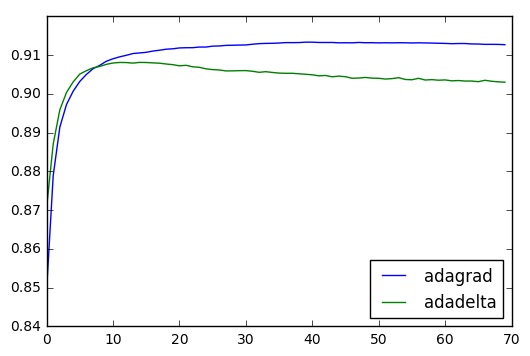

In [46]:
# ROC AUC

alpha = 1e-3
epochs = 70

adagrad_model = LightFM(no_components=30,
                        loss='warp',
                        learning_schedule='adagrad',
                        user_alpha=alpha,
                        item_alpha=alpha)
adadelta_model = LightFM(no_components=30,
                        loss='warp',
                        learning_schedule='adadelta',
                        user_alpha=alpha,
                        item_alpha=alpha)

adagrad_auc = []

for epoch in range(epochs):
    adagrad_model.fit_partial(train, epochs=1)
    adagrad_auc.append(auc_score(adagrad_model, test).mean())


adadelta_auc = []

for epoch in range(epochs):
    adadelta_model.fit_partial(train, epochs=1)
    adadelta_auc.append(auc_score(adadelta_model, test).mean())
    
x = np.arange(len(adagrad_auc))
plt.plot(x, np.array(adagrad_auc))
plt.plot(x, np.array(adadelta_auc))
plt.legend(['adagrad', 'adadelta'], loc='lower right')
plt.show()

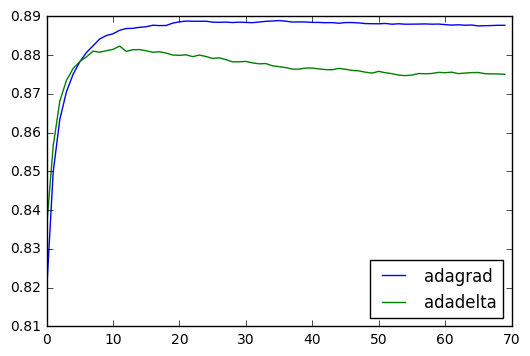

In [47]:
#k-OS Loss

alpha = 1e-3
epochs = 70

adagrad_model = LightFM(no_components=30,
                        loss='warp-kos',
                        learning_schedule='adagrad',
                        user_alpha=alpha, item_alpha=alpha)
adadelta_model = LightFM(no_components=30,
                        loss='warp-kos',
                        learning_schedule='adadelta',
                        user_alpha=alpha, item_alpha=alpha)

adagrad_auc = []

for epoch in range(epochs):
    adagrad_model.fit_partial(train, epochs=1)
    adagrad_auc.append(auc_score(adagrad_model, test).mean())


adadelta_auc = []

for epoch in range(epochs):
    adadelta_model.fit_partial(train, epochs=1)
    adadelta_auc.append(auc_score(adadelta_model, test).mean())
    
x = np.arange(len(adagrad_auc))
plt.plot(x, np.array(adagrad_auc))
plt.plot(x, np.array(adadelta_auc))
plt.legend(['adagrad', 'adadelta'], loc='lower right')
plt.show()

### AWS

- Graphlab Community AMI


### Combine with IMDB
    ### LDA Topic Modeling

### Alternating Least Squares
    ### https://bugra.github.io/work/notes/2014-04-19/alternating-least-squares-method-for-collaborative-filtering/
   

### 

